# Prepare grids for gravity inversion

import the necessary packages

In [1]:
%%capture
%load_ext autoreload
%autoreload 2
import pygmt
import pandas as pd
import xarray as xr
import pooch
import zarr
from antarctic_plots import fetch, regions, utils, maps

from pygmt import session_management

session_management.end()
session_management.begin()

# Set region 
define parameters to use for preparing the grids

In [2]:
# region = [-1560e3, 1400e3, -2400e3, 560e3]
region = [-960e3, 800e3, -1800e3, -60e3]
spacing = 1000
registration = "g"
reference = "ellipsoid"

/home/tankerma/miniconda/envs/RIS_gravity_inversion/lib/python3.10/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


returning original grid


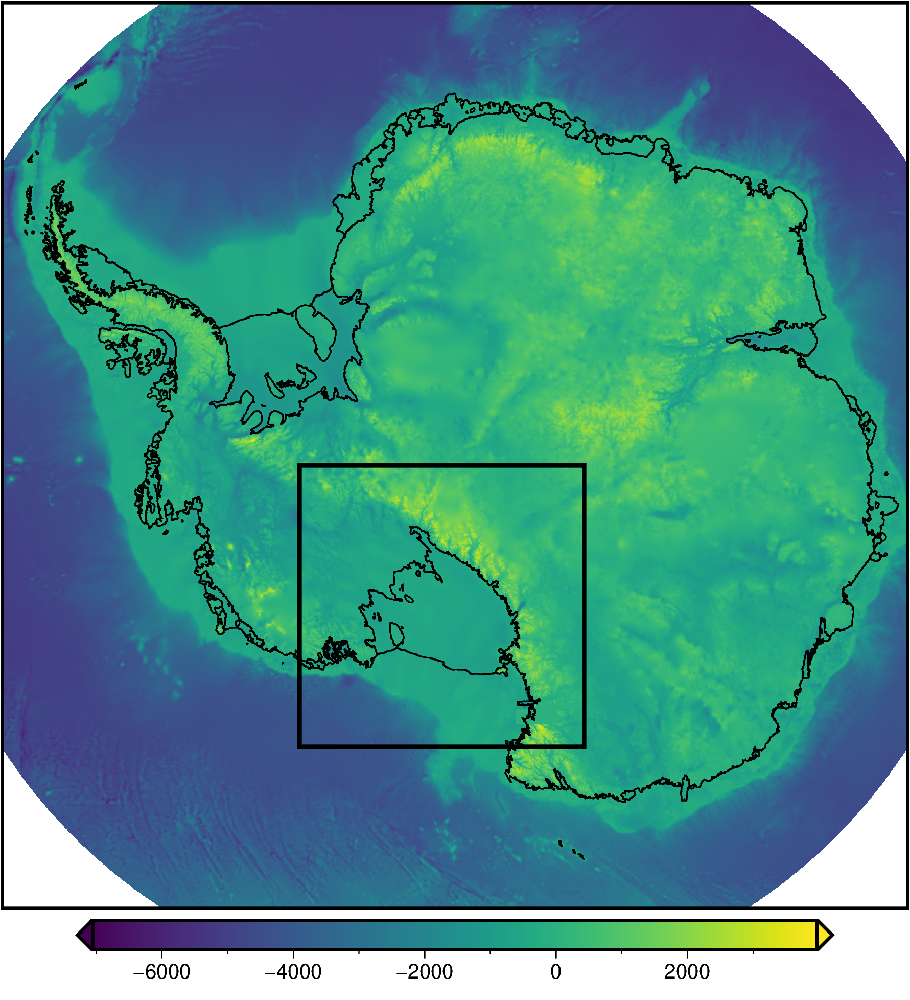

In [3]:
fig = maps.plot_grd(
    fetch.bedmap2(layer="bed"),
    coast=True,
    region=regions.antarctica,
    show_region=region,
)
fig.show()

# Load and save as .zarr files

Load the grids and save the results to .zarr files in `RIS_gravity_inversion/inversion_layers/`

use Antarctic-Plots to fetch data, set the reference frame, change the spacing and region. 

## Ice surface

In [26]:
bedmachine_surface = fetch.bedmachine(
    layer="surface",
    reference=reference,
    region=region,
    spacing=spacing,
    registration=registration,
)

bedmap2_surface = fetch.bedmap2(
    layer="surface",
    reference=reference,
    region=region,
    spacing=spacing,
    registration=registration,
    fill_nans=True,
)

# set conventional names
# bedmap2_surface = bedmap2_surface.rename({"x": "easting", "y": "northing"})
# bedmachine_surface = bedmachine_surface.rename({"x": "easting", "y": "northing"})

# convert to datasets
bedmachine_surface = bedmachine_surface.to_dataset(name="surface")
bedmap2_surface = bedmap2_surface.to_dataset(name="surface")

# save to zarr files
bedmap2_surface.to_zarr(
    "../inversion_layers/bedmap2_surface.zarr",
    encoding={"surface": {"compressor": zarr.Blosc()}},
    mode="w",
)
bedmachine_surface.to_zarr(
    "../inversion_layers/bedmachine_surface.zarr",
    encoding={"surface": {"compressor": zarr.Blosc()}},
    mode="w",
)

converting to be reference to the WGS84 ellipsoid
spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


spacing larger than original, filtering and resampling
converting to be referenced to the WGS84 ellipsoid
returning grid with new region and/or registration, same spacing


In [27]:
bedmap2_surface = xr.open_zarr("../inversion_layers/bedmap2_surface.zarr")["surface"]
bedmap2_surface

<xarray.DataArray 'surface' (y: 1741, x: 1761)>
dask.array<open_dataset-d1ed0584901e449b4ad400464544511fsurface, shape=(1741, 1761), dtype=float32, chunksize=(436, 441), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 -9.6e+05 -9.59e+05 -9.58e+05 ... 7.99e+05 8e+05
  * y        (y) float64 -1.8e+06 -1.799e+06 -1.798e+06 ... -6.1e+04 -6e+04
Attributes:
    actual_range:  [-65.86804962158203, 3872.792724609375]
    long_name:     z

In [28]:
bedmachine_surface = xr.open_zarr("../inversion_layers/bedmachine_surface.zarr")[
    "surface"
]
bedmachine_surface

<xarray.DataArray 'surface' (y: 1741, x: 1761)>
dask.array<open_dataset-4f7fd0a38c2afa115119515d06af3893surface, shape=(1741, 1761), dtype=float32, chunksize=(436, 441), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 -9.6e+05 -9.59e+05 -9.58e+05 ... 7.99e+05 8e+05
  * y        (y) float64 -1.8e+06 -1.799e+06 -1.798e+06 ... -6.1e+04 -6e+04
Attributes:
    actual_range:  [-66.0, 4345.72509765625]
    long_name:     z

returning original grid
returning original grid


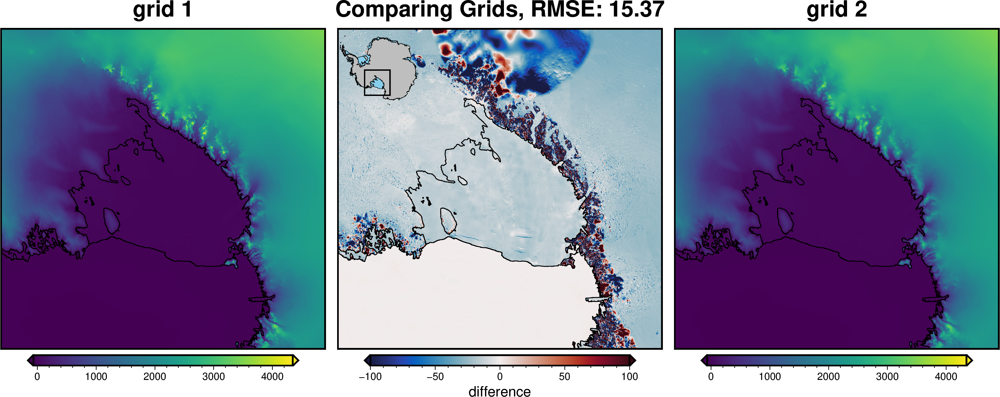

In [7]:
grids = utils.grd_compare(
    bedmachine_surface,
    bedmap2_surface,
    plot=True,
    diff_maxabs=100,
    hist=True,
)

##  Ice base

In [29]:
bedmachine_icebase = fetch.bedmachine(
    layer="icebase",
    reference=reference,
    region=region,
    spacing=spacing,
    registration=registration,
)

bedmap2_icebase = fetch.bedmap2(
    layer="icebase",
    reference=reference,
    region=region,
    spacing=spacing,
    registration=registration,
    fill_nans=True,
)
# bedmap2_icebase = bedmap2_icebase.fillna(0)

# set conventional names
# bedmap2_icebase = bedmap2_icebase.rename({"x": "easting", "y": "northing"})
# bedmachine_icebase = bedmachine_icebase.rename({"x": "easting", "y": "northing"})

# convert to datasets
bedmachine_icebase = bedmachine_icebase.to_dataset(name="icebase")
bedmap2_icebase = bedmap2_icebase.to_dataset(name="icebase")

# save to zarr files
bedmap2_icebase.to_zarr(
    "../inversion_layers/bedmap2_icebase.zarr",
    encoding={"icebase": {"compressor": zarr.Blosc()}},
    mode="w",
)
bedmachine_icebase.to_zarr(
    "../inversion_layers/bedmachine_icebase.zarr",
    encoding={"icebase": {"compressor": zarr.Blosc()}},
    mode="w",
)

converting to be reference to the WGS84 ellipsoid
spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


spacing larger than original, filtering and resampling
converting to be referenced to the WGS84 ellipsoid
returning grid with new region and/or registration, same spacing


In [30]:
bedmap2_icebase = xr.open_zarr("../inversion_layers/bedmap2_icebase.zarr")["icebase"]
bedmap2_icebase

<xarray.DataArray 'icebase' (y: 1741, x: 1761)>
dask.array<open_dataset-3d25364f00a147e14c168a818aa58a44icebase, shape=(1741, 1761), dtype=float32, chunksize=(436, 441), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 -9.6e+05 -9.59e+05 -9.58e+05 ... 7.99e+05 8e+05
  * y        (y) float64 -1.8e+06 -1.799e+06 -1.798e+06 ... -6.1e+04 -6e+04
Attributes:
    actual_range:  [-2782.721923828125, 3722.66943359375]
    long_name:     z

In [31]:
bedmachine_icebase = xr.open_zarr("../inversion_layers/bedmachine_icebase.zarr")[
    "icebase"
]
bedmachine_icebase

<xarray.DataArray 'icebase' (y: 1741, x: 1761)>
dask.array<open_dataset-c8561c81ff0445b3c24ab02ac4fbd24dicebase, shape=(1741, 1761), dtype=float32, chunksize=(436, 441), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 -9.6e+05 -9.59e+05 -9.58e+05 ... 7.99e+05 8e+05
  * y        (y) float64 -1.8e+06 -1.799e+06 -1.798e+06 ... -6.1e+04 -6e+04
Attributes:
    actual_range:  [-3423.736083984375, 4345.72509765625]
    long_name:     z

returning original grid
returning original grid


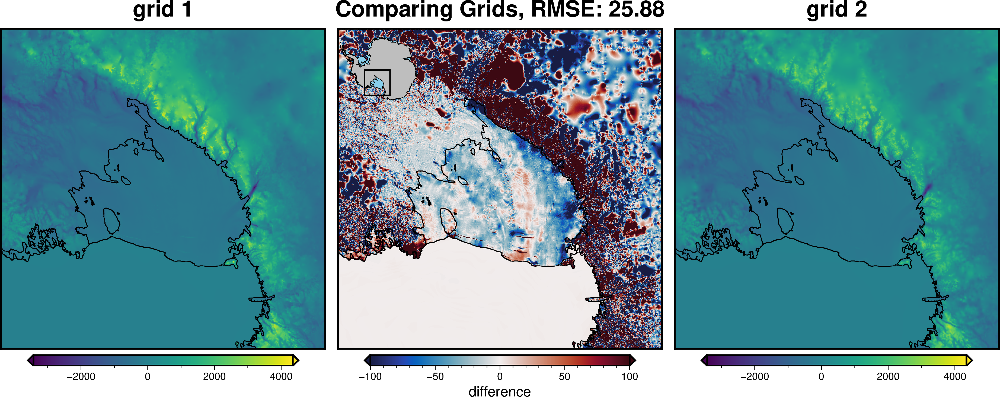

In [11]:
grids = utils.grd_compare(
    bedmachine_icebase,
    bedmap2_icebase,
    plot=True,
    diff_maxabs=100,
    hist=True,
)

## Bed

In [4]:
bedmachine_bed = fetch.bedmachine(
    layer="bed",
    reference=reference,
    region=region,
    spacing=spacing,
    registration=registration,
)

bedmap2_bed = fetch.bedmap2(
    layer="bed",
    reference=reference,
    region=region,
    spacing=spacing,
    registration=registration,
)

# set conventional names
# bedmachine_bed = bedmachine_bed.rename({"x": "easting", "y": "northing"})
# bedmap2_bed = bedmap2_bed.rename({"x": "easting", "y": "northing"})

# convert to datasets
bedmachine_bed = bedmachine_bed.to_dataset(name="bed")
bedmap2_bed = bedmap2_bed.to_dataset(name="bed")


# save to zarr files
bedmap2_bed.to_zarr(
    "../inversion_layers/bedmap2_bed.zarr",
    encoding={"bed": {"compressor": zarr.Blosc()}},
    mode="w",
)
bedmachine_bed.to_zarr(
    "../inversion_layers/bedmachine_bed.zarr",
    encoding={"bed": {"compressor": zarr.Blosc()}},
    mode="w",
)

converting to be reference to the WGS84 ellipsoid
spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


spacing larger than original, filtering and resampling
converting to be referenced to the WGS84 ellipsoid
returning grid with new region and/or registration, same spacing


In [5]:
bedmap2_bed = xr.open_zarr("../inversion_layers/bedmap2_bed.zarr")["bed"]
bedmap2_bed

<xarray.DataArray 'bed' (y: 1741, x: 1761)>
dask.array<open_dataset-a2da0b34bf25299048a0a46880fefed2bed, shape=(1741, 1761), dtype=float32, chunksize=(436, 441), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 -9.6e+05 -9.59e+05 -9.58e+05 ... 7.99e+05 8e+05
  * y        (y) float64 -1.8e+06 -1.799e+06 -1.798e+06 ... -6.1e+04 -6e+04
Attributes:
    actual_range:  [-5162.05029296875, 3722.66943359375]
    long_name:     z

In [8]:
bedmachine_bed = xr.open_zarr("../inversion_layers/bedmachine_bed.zarr")["bed"]
bedmachine_bed

<xarray.DataArray 'bed' (y: 1741, x: 1761)>
dask.array<open_dataset-30c05fc72aa57590545623a67cab0b2bbed, shape=(1741, 1761), dtype=float32, chunksize=(436, 441), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 -9.6e+05 -9.59e+05 -9.58e+05 ... 7.99e+05 8e+05
  * y        (y) float64 -1.8e+06 -1.799e+06 -1.798e+06 ... -6.1e+04 -6e+04
Attributes:
    actual_range:  [-4424.22265625, 4345.72509765625]
    long_name:     z

returning original grid
returning original grid
returning original grid
returning original grid
returning original grid


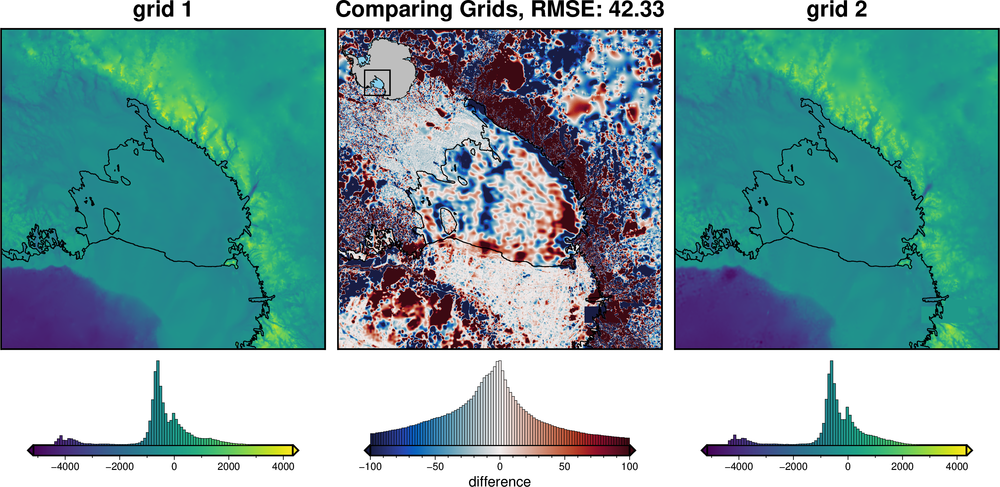

In [7]:
grids = utils.grd_compare(
    bedmachine_bed,
    bedmap2_bed,
    plot=True,
    diff_maxabs=100,
    hist=True
)

5km version of bedmachine bed

In [13]:
bedmachine_bed_5k = fetch.resample_grid(bedmachine_bed, spacing=5e3)
print("Bedmachine bed 5k info:", utils.get_grid_info(bedmachine_bed_5k))

spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


Bedmachine bed 5k info: (5000.0, [-960000.0, 800000.0, -1800000.0, -60000.0], -4414.96582031, 4053.66796875, 'g')


## Basement

### Ross Embayment magnetic basement

returning grid with new region and/or registration, same spacing
(5000.0, [-960000.0, 800000.0, -1800000.0, -60000.0], -8502.59960938, -526.921508789, 'g')


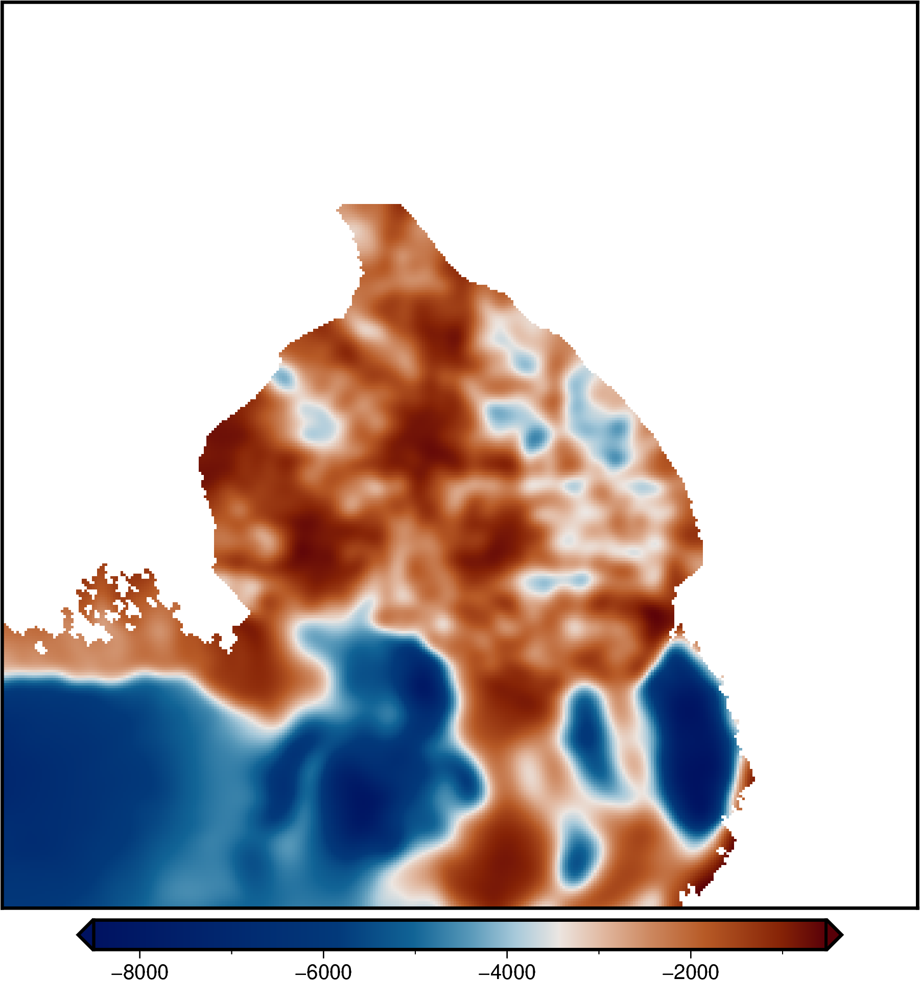

In [14]:
RIS_basement = fetch.basement(
    region=region,
    spacing=5000,
    registration=registration,
)
print(utils.get_grid_info(RIS_basement))
# assert utils.get_grid_info(RIS_basement) == (
#     5000.0,
#     [-1560000.0, 1400000.0, -2400000.0, 560000.0],
#     -8502.59960938,
#     -492.665466309,
#     "g",
# )
fig = maps.plot_grd(RIS_basement, cmap="vik", grd2cpt=True)
fig.show()

### ANTASed sediment thickness model

In [15]:
# get sediment thickness
ANTASed_sediment_thickness = fetch.sediment_thickness(
    version="ANTASed",
    region=region,
    spacing=5000,
    registration="g",
)
print(utils.get_grid_info(ANTASed_sediment_thickness))
# assert utils.get_grid_info(ANTASed_sediment_thickness) == (
#     5000.0,
#     [-1560000.0, 1400000.0, -1990000.0, 560000.0],
#     -294.53125,
#     12430.0,
#     "g",
# )

# subtract antased from bedmachine to get basement depths
grids = utils.grd_compare(bedmachine_bed_5k, ANTASed_sediment_thickness, plot=False)
# select the difference grid (first 1)
ANTASed_basement = grids[0]
print(utils.get_grid_info(ANTASed_basement))

Warning, requested spacing (5000) is smaller than the original  (10000.0).
(5000.0, [-960000.0, 800000.0, -1800000.0, -60000.0], -98.0859375, 5840.0, 'g')
returning original grid
returning original grid
(5000.0, [-960000.0, 800000.0, -1800000.0, -60000.0], -6609.55419922, 4053.66796875, 'g')


### Merge ANTASed to RIS Basement

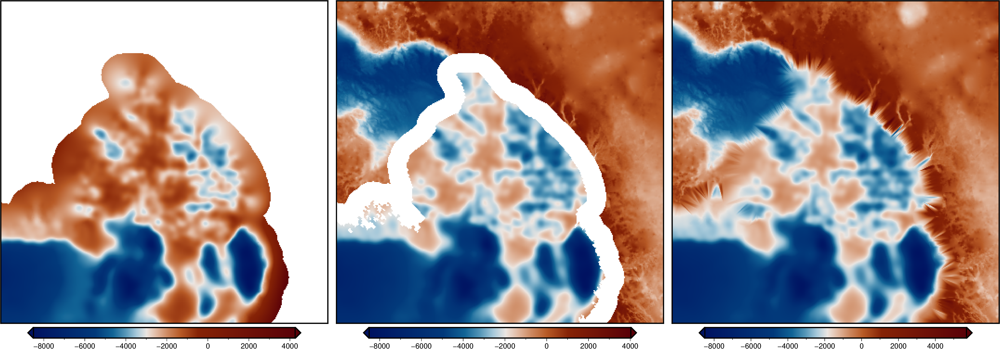

In [16]:
# convert magnetic basement dataarray to dataframe
RIS_basement_xyz = pygmt.grd2xyz(RIS_basement, skiprows=True)
# re-surface with a 20cell buffer
RIS_basement_buffer = pygmt.surface(
    data=RIS_basement_xyz,
    spacing="5000",
    region=region,
    M="20c",
)

# mask ANTASed to region outside the buffered magnetic basement
mask = RIS_basement_buffer.isnull()
mask_ANTASed = ANTASed_basement.where(mask == 1)

# merge 2 grids with buffer zone between
merged = xr.merge([mask_ANTASed, RIS_basement]).z

# interpolate the gap
merged.rio.write_nodata("nan", inplace=True)
merged.rio.write_crs("epsg:3031", inplace=True)
ANTASed_magnetics_merged_basement = merged.rio.interpolate_na(method="cubic")

fig = maps.plot_grd(RIS_basement_buffer, cmap="vik", grd2cpt=True)
fig = maps.plot_grd(merged, cmap="vik", grd2cpt=True, fig=fig, origin_shift="xshift")
fig = maps.plot_grd(
    ANTASed_magnetics_merged_basement,
    cmap="vik",
    grd2cpt=True,
    fig=fig,
    origin_shift="xshift",
)
fig.show()

ANTASed_magnetics_merged_basement = ANTASed_magnetics_merged_basement.to_dataset(
    name="basement"
).drop_vars(["spatial_ref"])

# save to zarr file
ANTASed_magnetics_merged_basement.to_zarr(
    "../inversion_layers/ANTASed_magnetics_merged_basement.zarr",
    encoding={"basement": {"compressor": zarr.Blosc()}},
    mode="w",
)

### Merge RIS Basement with Bedmachine Bed

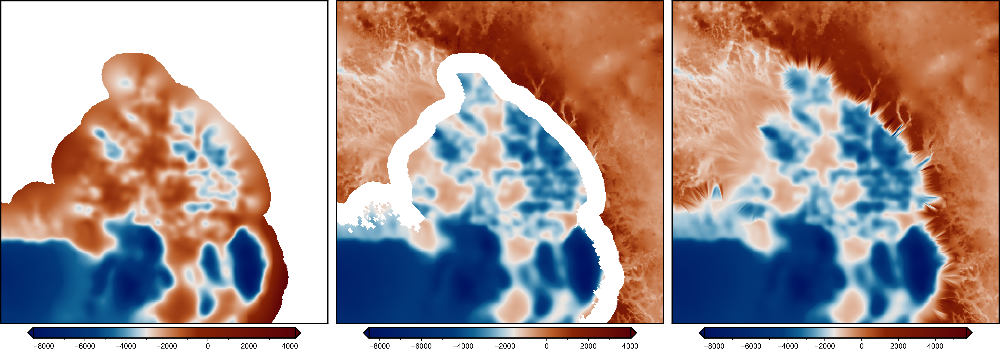

In [17]:
# mask bed to region outside the buffered magnetic basement
mask = RIS_basement_buffer.isnull()
mask_bedmachine_bed = bedmachine_bed_5k.where(mask == 1)

# merge 2 grids with buffer zone between
merged = xr.merge([mask_bedmachine_bed, RIS_basement]).z

# interpolate the gap
merged.rio.write_nodata("nan", inplace=True)
merged.rio.write_crs("epsg:3031", inplace=True)
bed_basement_merged = merged.rio.interpolate_na(method="cubic")

fig = maps.plot_grd(RIS_basement_buffer, cmap="vik", grd2cpt=True)
fig = maps.plot_grd(merged, cmap="vik", grd2cpt=True, fig=fig, origin_shift="xshift")
fig = maps.plot_grd(
    bed_basement_merged, cmap="vik", grd2cpt=True, fig=fig, origin_shift="xshift"
)
fig.show()

bed_basement_merged = bed_basement_merged.to_dataset(name="basement").drop_vars(
    ["spatial_ref"]
)

# save to zarr file
bed_basement_merged.to_zarr(
    "../inversion_layers/bed_basement_merged.zarr",
    encoding={"basement": {"compressor": zarr.Blosc()}},
    mode="w",
)

### Compare

In [18]:
ANTASed_magnetics_merged_basement = xr.open_zarr(
    "../inversion_layers/ANTASed_magnetics_merged_basement.zarr"
)["basement"]
ANTASed_magnetics_merged_basement

<xarray.DataArray 'basement' (y: 349, x: 353)>
dask.array<open_dataset-1a22f9eae8a9f78589cd62d8cae738e0basement, shape=(349, 353), dtype=float64, chunksize=(175, 177), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 -9.6e+05 -9.55e+05 -9.5e+05 ... 7.9e+05 7.95e+05 8e+05
  * y        (y) float64 -1.8e+06 -1.795e+06 -1.79e+06 ... -6.5e+04 -6e+04

In [19]:
bed_basement_merged = xr.open_zarr("../inversion_layers/bed_basement_merged.zarr")[
    "basement"
]
bed_basement_merged

<xarray.DataArray 'basement' (y: 349, x: 353)>
dask.array<open_dataset-40f3e478ca8df799758dd523c6003e78basement, shape=(349, 353), dtype=float64, chunksize=(175, 177), chunktype=numpy.ndarray>
Coordinates:
  * x        (x) float64 -9.6e+05 -9.55e+05 -9.5e+05 ... 7.9e+05 7.95e+05 8e+05
  * y        (y) float64 -1.8e+06 -1.795e+06 -1.79e+06 ... -6.5e+04 -6e+04
Attributes:
    actual_range:  [-4414.9658203125, 4053.66796875]
    long_name:     z

returning original grid
returning original grid


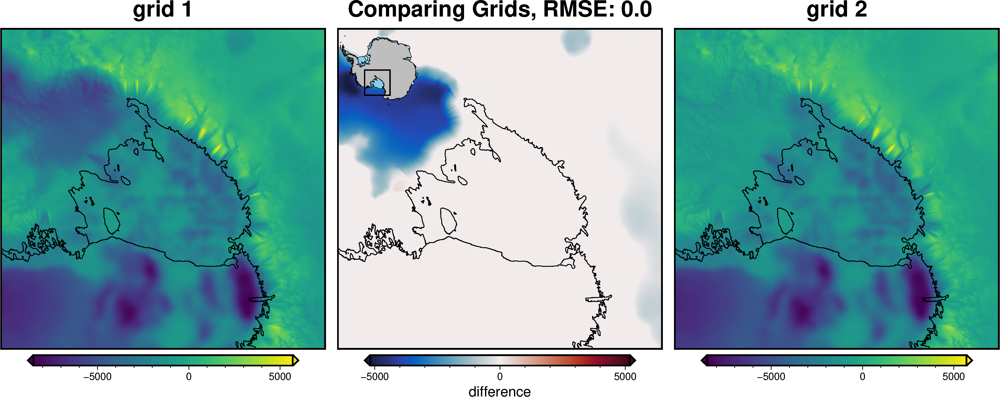

In [20]:
grids = utils.grd_compare(
    ANTASed_magnetics_merged_basement,
    bed_basement_merged,
    plot=True,
)

## Moho

### An et al. 2015

returning original grid
returning grid with new region and/or registration, same spacing
(5000.0, [-960000.0, 800000.0, -1800000.0, -60000.0], -44587.3476562, -7475.98974609, 'g')
spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


(5000.0, [-960000.0, 800000.0, -1800000.0, -60000.0], -42959.1640625, -7538.98974609, 'g')


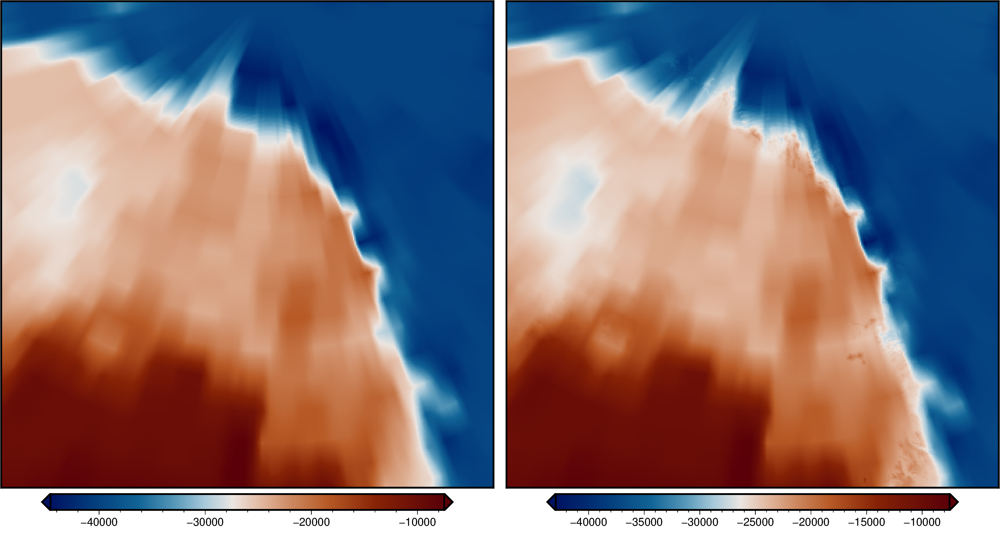

In [21]:
An_moho = fetch.moho(
    version="an-2015",
    region=region,
    spacing=5000,
    registration=registration,
)
print(utils.get_grid_info(An_moho))
# assert utils.get_grid_info(An_moho) == (
#     5000.0,
#     [-1560000.0, 1400000.0, -2400000.0, 560000.0],
#     -65036.3632812,
#     -7473.28857422,
#     "g",
# )

An_moho_rel_to_bed = fetch.resample_grid(bedmachine_surface, spacing=5e3) + An_moho
print(utils.get_grid_info(An_moho_rel_to_bed))
# assert utils.get_grid_info(An_moho_rel_to_bed) == (
#     5000.0,
#     [-1560000.0, 1400000.0, -2400000.0, 560000.0],
#     -61256.7382812,
#     -7529.28857422,
#     "g",
# )
fig = maps.plot_grd(An_moho, cmap="vik", grd2cpt=True)
fig = maps.plot_grd(
    An_moho_rel_to_bed, cmap="vik", grd2cpt=True, fig=fig, origin_shift="xshift"
)
fig.show()

### Shen et al. 2018

Warning, requested spacing (5000) is smaller than the original  (10000.0).
(5000.0, [-960000.0, 800000.0, -1800000.0, -60000.0], -50408.5273438, -17217.0976562, 'g')
spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


(5000.0, [-960000.0, 800000.0, -1800000.0, -60000.0], -47807.7226562, -16993.6015625, 'g')


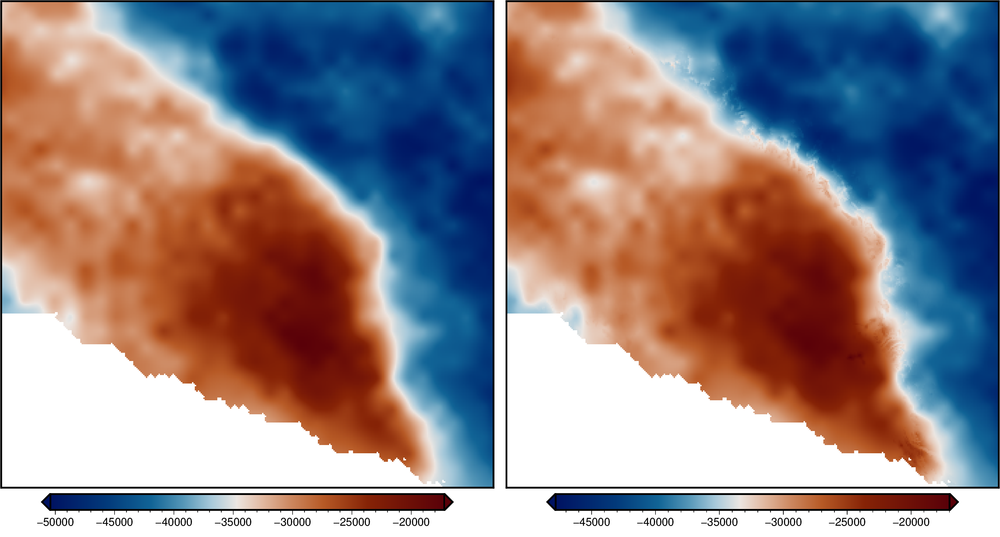

In [22]:
Shen_moho = fetch.moho(
    version="shen-2018",
    region=region,
    spacing=5000,
    registration="g",
)
print(utils.get_grid_info(Shen_moho))
# assert utils.get_grid_info(Shen_moho) == (
#     5000.0,
#     [-1560000.0, 1400000.0, -2400000.0, 560000.0],
#     -57238.3164062,
#     -17217.0976562,
#     "g",
# )

Shen_moho_rel_to_bed = fetch.resample_grid(bedmachine_surface, spacing=5e3) + Shen_moho
print(utils.get_grid_info(Shen_moho_rel_to_bed))
# assert utils.get_grid_info(Shen_moho_rel_to_bed) == (
#     5000.0,
#     [-1560000.0, 1400000.0, -2400000.0, 560000.0],
#     -53469.4023438,
#     -16993.6015625,
#     "g",
# )
fig = maps.plot_grd(Shen_moho, cmap="vik", grd2cpt=True)
fig = maps.plot_grd(
    Shen_moho_rel_to_bed, cmap="vik", grd2cpt=True, fig=fig, origin_shift="xshift"
)
fig.show()

# rosetta ice thickness

In [23]:
file_path = pooch.retrieve(
    # URL to one of Pooch's test files
    url="http://wonder.ldeo.columbia.edu/data/ROSETTA-Ice/DerivedProducts/DICE_IceThickness/rs_2019_DICE_Ice_Thickness.txt",
    known_hash="5dc63064ef32bfdd0f83b506bc8a1241b2bbad62d54ca7151bda4b66f6320695",
)
ice = pd.read_csv(file_path)
file_path

'/Users/home/tankerma/.cache/pooch/ece865c9915275b0ec499cb7710b1b65-rs_2019_DICE_Ice_Thickness.txt'

# rosetta density model

In [24]:
file_path = pooch.retrieve(
    # URL to one of Pooch's test files
    url="http://wonder.ldeo.columbia.edu/data/ROSETTA-Ice/DerivedProducts/Density/rs_2019_density.csv",
    known_hash="8c3d6f69087095ab1a184d0517a136ebd59e4761110601b30da1ef3685883617",
)
density = pd.read_csv(file_path)